# Project Selection Lab
**Objectives:**
- qqq
    - qqq
    - qqq

## Project Selection Problem
Here we provide a walkthrough of the Tool Selection problem (sometimes known as the Tool Selection problem), which we will then cleverly reduce to a min-cut instance where the cut defines the optimal set of projects we want to select. This problem is often used to help companies determine which projects they should take on in order to maximize their total profit given that they know the costs and rewards of completing each project, and there are overlapping costs between some of the projects.

The problem is as follows: suppose you have a set of projects $p_1, p_2, ..., p_n$ and a set of tools $t_1, t_2, ..., t_m$. Each project $p_i$ has with it an associated reward/benefit for completing it $b_i$ and a set of tools that it depends on in order to be completed $D_i$. Each tool $t_j$ has an associated cost for acquiring it $c_j$, but once acquired, can be used an infinite amount of times. We can imagine the tools, for example, to be various software that we need to purchase licenses for to be used in certain projects. Let's denote the set of projects we end up taking as $P$ and the set of tools we buy as $T$.

The goal here is that we want to maximize the profit that we earn. That is, we want to maximize the total benefit we get from the projects we take minus the total cost we have to endure in order to do those projects. Here's what that looks like if we turn it into an objective function: *maximize* $\sum_{p_i \in P}^{} b_i - \sum_{t_i \in T}^{} c_i$

Upon first glance, you might think "well, this is a maximization problem so if I were to turn it into some instance of a network flow problem, I would probably try max flow first." Take a moment to think about how you might model that... tricky right? Unfortunately for us, even though the objective function the problem defines for us seems to neatly fit into a max-flow model, there actually isn't any immediately clear way to model it in that way. So, we need to make a clever change to our objective function to expand the options we have for modeling this problem, and we'll do so by turning it into a minimization function.

**Q:** Rewrite *maximize* $\sum_{p_i \in P}^{} b_i - \sum_{t_i \in T}^{} c_i$ as a minimization function.

**A:** <font color='blue'> *minimize* $-\sum_{p_i \in P}^{} b_i + \sum_{t_i \in T}^{} c_i$ </font>

If we denote the entire set of potential projects as $S$ and the set of projects we don't choose as $\overline{P}$, we can write an equation for the total benefit of taking all the projects as a sum of the benefits of projects we take and projects we do not take.

**Q:** Write an equation for $\sum_{p_i \in S}^{} b_i$ using summations over $p_i \in P$ and $p_i \in \overline{P}$.

**A:** <font color='blue'> $\sum_{p_i \in S}^{} b_i = \sum_{p_i \in P}^{} b_i + \sum_{p_i \in \overline{P}}^{} b_i$ </font>

**Q:** Now replace the term $\sum_{p_i \in P}^{} b_i$ in the minimization function using the equation you just wrote in the previous question. (You'll most likely have to shift some terms around)

**A:** <font color='blue'> *minimize* $-\sum_{p_i \in S}^{} b_i - \sum_{p_i \in \overline{P}}^{} b_i + \sum_{t_i \in T}^{} c_i$ 
 (because $\sum_{p_i \in P}^{} b_i = \sum_{p_i \in S}^{} b_i - \sum_{p_i \in \overline{P}}^{} b_i$) </font>

You should have gotten a function in terms of sums over $S$, $\overline{P}$, and $T$. In particular, there should be the term  $\sum_{p_i \in S}^{} b_i$. Note that because this is a constant, it will affect our objective function the same way in any solution we find, so we can remove it from our objective function completely without changing the optimality of our solution.

**Q:** Rewrite the objective function with the constant term removed. Hint: it should be contain two summations.

**A:** <font color='blue'> *minimize* $\sum_{p_i \in \overline{P}}^{} b_i + \sum_{t_i \in T}^{} c_i$ </font>

**Q:** Write out in English the meaning behind the function you got in the previous question.

**A:** <font color='blue'> minimize the sum of benefits from projects we do not take on plus the sum of the costs of tools we buy </font>

How can we interpret this new objective function? We can think of it as minimizing the opportunity cost of projects we don't take on, that is the benefit we are giving up by choosing not to complete a certain project, along with the cost of buying tools to complete the projects we do choose. Hopefully, at this point you can see how this helps us acheive our original goal of maximizing profit.

Now, it's starting to look more intuitive that we might be able to produce a min-cut instance from this problem, so let's start walking through how we might go about our model. In a normal min-cut instance, we have capacities on every edge and the capacities of edges leaving the cut we choose contribute to the objective function value (which as a reminder was *minimize* $\sum_{i \in S, j \in T}^{} c_{i,j}$).

**Q:** Based on the parallels between objective functions, what do you think we should use for the capacities of edges in our network flow graph?

**A:** <font color='blue'> the benefits of projects and the costs of tools </font>

Now let's start to put our network flow graph together. Hopefully in the previous question, you wrote something that assigns capacities depending on whether we're looking at a project or a tool. This suggests that in our network, we want to at least have a node for each project and each tool (along with a source and a sink which we'll add toward the end). Let's use that idea and experiment with the different ways we can add edges and corresponding capacities.

Let's first look at assigning those capacities to outgoing edges of both project and tool nodes. Remember that only edges leaving the cut, starting inside and ending outside, contribute to the capacity of the cut. Also, let's remind ourselves that our goal is for projects and tools we use to be inside the s-side of the cut.

Suppose we have the following projects and tools:

| Project     | Benefit      |
| ----------- | -----------  |
| 1           | 2            |
| 2           | 3            |


| Tool        | Cost         |
| ----------- | -----------  |
| A           | 1            |
| B           | 4            |
| C           | 5            |


Consider the following cut:

![](images-lab/tool-selection-images/outgoing_edges_cut.png)

**Q:** What edges contribute to the capacity of the cut? Hint: the capacity of the cut should add up to 4

**A:** <font color='blue'> edges leaving project 2 and tool A </font>

**Q:** Which tool(s) do we use? Do their costs contribute to the cut capacity?

**A:** <font color='blue'> tool A, yes </font>

**Q:** Which project(s) do we not take? Do their benefits contribute to the cut capacity?

**A:** <font color='blue'> project 1, no </font>

**Q:** In this case, the benefits of projects we take are adding to the capacity of the cut, a value that we are trying to minimize. Using the plain English definition of the objective function you wrote earlier, explain why this model doesn't quite work out.

**A:** <font color='blue'> Right now although we are correctly incorporating the costs of tools we use to be included in the capacity of the cut, we are including the benefits of projects we take rather than the benefits of projects we do NOT take. </font>

So this model of our network uses the cost of tools like we wanted (costs of tools we use contribute to the cut capacity) but also adds the benefits of projects we take to the cut capacity. What does this mean? Considering our objective function is a minimization function, this means that technically, we would be trying to minimize the benefits of projects we take, which is the opposite of what we want! Okay, so it looks like assigning costs of tools to outgoing edges worked out well, but we probably shouldn't be assigning benefits to outgoing edges. Let's try assigning benefits to the incoming edges of project nodes instead.

Consider the following cut:

![](images-lab/tool-selection-images/in_outgoing_edges_cut.png)

**Q:** What edges contribute to the capacity of the cut? Hint: the capacity of the cut should add up to 3

**A:** <font color='blue'> edge into project 1 and edge leaving tool A </font>

**Q:** Which project(s) do we not take? Do their benefits contribute to the cut capacity?

**A:** <font color='blue'> project 1, yes </font>

Great! If you interpreted the cut correctly, you'll have found that this assignment of edge capacities uses the costs of tools we need and benefits of projects we don't take exactly as we wanted from our objective function. Here, projects and tools we use are inside the cut, and the capacity of the cut reflects benefits of projects we left out (essentially opportunity costs of not taking on a project) and costs of tools we needed to use. 

Since all the projects now have incoming edges, it seems likely these incoming edges could all originate from the same source and since all the tool nodes now have outgoing edges, it's likely they could all end at the same sink node. Another point of intuition is that since the source is always on the s-side of the cut, by having the source connect to each project node, if a project is not in the cut, then we know its connecting edge from $s$ will contribute to the cut capacity. Similarly, since the sink node is always not in the cut, if we use any tool, its connecting edge to $t$ will contribute as well. Let's visualize the network so far after adding $s$ and $t$:

![](images-lab/tool-selection-images/incomplete_graph.png)

It looks somewhat similar to our bipartite matching graph since we can divide the project and tool nodes quite well, but there is a bit more going on here. Let's focus on how to tie the network together with edges between project and tool nodes. We need some way to encode the dependencies between projects and the tools they require. In the min-cut model, this means that if project 1 depends on tools A and B, we need a way to ensure that if we include project 1 in the cut, we must also include tools A and B; they cannot be on opposite sides of the cut. A clever way to encode this is using infinite-capacity edges, a very powerful modeling tool. Here, since we want some relationship between projects and tools, we'll have these edges be between the two layers of nodes.

**Q:** You might be concerned that if we choose the cut such that an $\infty$ capacity edge crosses the cut, we'll have a cut capacity of $\infty$ which, in almost all cases, is certainly not the minimum. But let's say that we can guarantee that there always exists a finite capacity cut. Why do we not have to worry about $\infty$ capacity edges crosssing the minimum cut our algorithm yields?

**A:** <font color='blue'> Because if there was a finite capacity cut, our algorithm would always return that over the cut where a $\inf$ capacity edge crosses the cut as this would cause the cut to have $\infty$ capacity which is greater than any finite value. </font>

Now, we have to determine the direction of these infinite-capacity edges. Let's just look at our project and tool nodes in isolation. Suppose we have the following dependencies: 

| Project     | Tools Needed |
| ----------- | -----------  |
| 1           | A, B         |
| 2           | B, C         |

Let's say we orient our edges this way:

![](images-lab/tool-selection-images/wrong_direction.png)

**Q:** Based on this network, fill in the blank: *If we take tool B then we must take project(s) ___ .*

**A:** <font color='blue'> 1 and 2 </font>

**Q:** Explain why this setup doesn't encode the depemdencies as we intended.

**A:** <font color='blue'> This setup encodes dependencies as if tools are dependent on the projects we take. Actually, we could realistically buy a tool and never use it for any project, but this encoding says if we buy a tool we must take on all projects that use it. In addition, it doesn't require us to buy all tools required for a project in order to take on that project. </font>

So that direction of infinite-capacity edges didn't work out. Let's try the other direction:

![](images-lab/tool-selection-images/right_direction.png)

**Q:** Based on this network, fill in the blank: *If we take project 2 then we must take tool(s) ___ .*

**A:** <font color='blue'> B and C </font>

Eureka! We've found the correct encoding! Now, we just need to make sure there always exists a cut of infinite capacity in our network. Well, let's take a look at the complete graph of the model we just outlined:

![](images-lab/tool-selection-images/complete_graph.png)

**Q:** Identify a cut of finite capacity (write the nodes on the s-side of the cut).

**A:** <font color='blue'> {$s$}, all nodes except $t$, etc. </font>

Certainly, we can also see that with this outline of generating our graph, we'll always have a finite capacity cut of just {s}. So, we are guaranteed that our infinite-capacity edges won't disturb the intended significance of our cut.

And that's it! We've just successfully reduced the tool selection problem to a min-cut instance and introduced a new technique involving infinite-capacity edges. To recap, here's what we did:

- we are given:
    - a set of projects, each project denoted $p_i$ with an associated benefit of completing it $b_i$
    - a set of tools, each tool denoted $t_j$ with an associated cost of buying it $c_j$
    - for each project $p_i$, a set of tools $D_i$ that it needs in order to complete it
- we want:
    - to maximize our profit (translated to minimizing our loss)
    - a set of projects to complete
    - a set of tools to buy
- objective function: minimize the forgone benefit (opportunity cost) of projects we don't do plus the cost of tools we buy 
    - *minimize* $\sum_{p_i \in \overline{P}}^{} b_i + \sum_{t_i \in T}^{} c_i$
- our graph has nodes: $s$, project nodes, tool nodes, $t$
    - we have an edge from the source to every project node $p_i$ with capacity $b_i$
    - we have an edge from every tool node $t_i$ to the sink with capacity $c_i$
    - we have an edge from a project node $p_i$ to a tool node $t_j$ with $\infty$ capacity if project $p_i$ needs tool $t_i$, (equivalently if $t_j \in D_i$)

Let's go through a complete formulation. Suppose you are given the following set of projects, tools, and dependencies:

| Project     | Benefit      |
| ----------- | -----------  |
| 1           | 6            |
| 2           | 9            |
| 3           | 7            |

| Tool        | Cost         |
| ----------- | -----------  |
| A           | 8            |
| B           | 2            |
| C           | 3            |
| D           | 5            |

| Project     | Tools Needed |
| ----------- | -----------  |
| 1           | A            |
| 2           | A, B         |
| 3           | C, D         |

**Q:** Draw the network for the min-cut instance of this problem.
 
**A:** <font color='blue'> ![](images-key/example_graph.png) </font>

**Q:** This network should be simple enough to be able to find the min-cut by hand. By inspection or using any tools you have learned in the past, write the projects and tools you end up choosing. (Check: there should be 2 projects and two tools)

**A:** <font color='blue'> projects 1 and 2, tools A and B ![](images-key/example_graph_cut.png) </font>

We have now successfully turned the Project Selection Problem into a minimum cut problem! We already know how to solve a minimum cut problem, so now we also know how to solve a Project Selection Problem. Let's now put this into practice.

## Recipe Application

There are countless applications of the Project Selection Problem. In this section, we will walk through an example related to choosing dishes.

You are in charge this year of making your family's Thanksgiving dinner! But you are stuck on what dishes to make. You would like to choose the dishes that your famliy will like best, but at the same time you don't want to spend too much on ingredients. Fortunately, you can use the Project Selection Problem to help with your decision.

#### Setting Up a Project Selection Problem

Say that you have a set of Thanksgiving dishes that you know how to make, and each dish has a recipe requiring particular ingredients. Think of how you would be able to model your problem of choosing what to make for Thanksgiving as a Project Selection Problem.

**Q:** In this application of the project selection problem, what should you consider to be the "tools" and what should you consider to be the "projects?"


**A:** <font color='blue'> The ingredients are the tools and the dishes/recipes are the projects. </font>

Let's make your dish selection problem a bit more concrete. Below are the dishes you are considering to make for dinner, together with a score of how much benefit you get from making the dish.
* Mashed potatoes: 3 $~~~$ (Mashed potatoes are good, but not stellar)
* Roasted vegetables: 6 $~~~$ (One of your favorite foods!)
* Stuffing: 2 $~~~$ (Your brother hates stuffing)
* Butternut squash soup: 5 $~~~$ (You're personally not a soup fan, but it's one of your aunt's favorite foods)
* Turkey: 15 $~~~$ (It would be a shame not to have turkey on thanksgiving)

**Q:** What do these values represent in terms of the general form of the Project Selection Problem?


**A:** <font color='blue'> The benefit values $b_i$ of the projects. </font>

Each dish has the following ingredients
* Mashed potatoes: Potatoes, milk, butter
* Roaster vegetables: Butternut squash, carrots, rosemary
* Stuffing: Bread, butter, rosemary
* Butternut squash soup: Butternut squash, milk
* Turkey: just turkey

And each ingredient has the following cost.
* Potatoes: 4
* Milk: 2
* Butter: 2
* Butternut squash: 4
* Carrots: 3
* Rosemary: 2
* Bread: 4
* Turkey: 10

**Q:** What do these values represent in terms of the general form of the Project Selection Problem?


**A:** <font color='blue'> The costs $c_i$ of the tools. </font>

Now, let's think about our objective.

**Q:** In English, what are we trying to minimize in our dish problem?


**A:** <font color='blue'> The total cost of the ingredients used by the dishes chosen minus the total benefit of the dishes chosen. </font>

**Q:** If we select turkey and butternut squash soup as our dishes, what would be our objective value?


**A:** <font color='blue'> cost of turkey + cost of butternut squash + cost of milk - benefit of turkey - benefit of soup = 10 + 4 + 2 - 15 - 5 = -4 </font>

Before we have succesfully modeled our dish dilemma as a Project Selection Problem, we first need to address a couple assumptions that need to be made.
* In the Project Selection Problem, once a tool is acquired, it can be used again and again without constraint. However, ingredients may not be able to be used repeatedly because the ingredient might run out. Assume that the ingredients always come in large packaging, so that once you buy an ingredient there is plenty of it to make any combination of dishes.
* The benefit values of each dish are simply made up. When applying the Project Selection Problem, there is not always a perfect way to quantify the cost of the tools or the benefit from the projects. Assigning quantitative values to qualitative benefits or costs can be tricky, but when done so strategically can still yield trustworthy results. We will assume that the values for each dish effectively capture the benefit of making the dish.

#### Reducing to a Minimum Cut

Now we that we have modeled our Thanksgiving dish problem as a Project Selection Problem, we will solve the Project Selection Problem by reducing it as a Minimum Cut Problem, just as you did in the first part of this lab. Remember that the fitst step is to create a graph for which finding a minimum cut is analogous to selecting the best combination of projects.

**Q:** Draw the graph for which finding the minimum cut is analogous to slecting the best combination of projects. Remember to label your nodes.


**A:** ![](images-key/recipes.png)

**Q:** On the graph you just drew, draw an s-t cut which would indicate the selection of mashed potatoes and soup as our dishes.

**A:** <font color='blue'> ![](images-key/recipes_cut.png) **You can also draw this cut by fully enclosing the roasted veggies and stuffing nodes, creating a doughnut shaped cut.** </font>

All we need to do now is find the minimum cut in this graph. We will do so using Python. Run the code below and look at the minimum cut at the end of the cell.

In [1]:
import networkx as nx

In [2]:
recipes = {
    'Mashed potatoes': ['Potatoes', 'milk', 'butter'],
    'Roasted vegetables': ['Butternut squash', 'Carrots', 'Rosemary'],
    'Stuffing': ['Bread', 'Butter', 'Rosemary'],
    'Butternut squash soup': ['Butternut squash', 'Milk'],
    'Turkey (dish)': ['Turkey (ingredient)']
}

benefits = {
    'Mashed potatoes': 3,
    'Roasted vegetables': 6,
    'Stuffing': 2,
    'Butternut squash soup': 5,
    'Turkey (dish)': 15
}

costs = {
    'Potatoes': 4,
    'Milk': 2,
    'Butter': 2,
    'Butternut squash': 4,
    'Carrots': 3,
    'Rosemary': 2,
    'Bread': 4,
    'Turkey (ingredient)': 10,
}


dishes = list(benefits.keys())
ingredients = list(costs.keys())
                   
g = nx.DiGraph()

for ingredient in ingredients:
    g.add_node(ingredient)
    g.add_edge(ingredient, 't', capacity=costs[ingredient])

for dish in dishes:
    g.add_node(dish)
    g.add_edge('s', dish, capacity=benefits[dish])
    for ingredient in recipes[dish]:
        g.add_edge(dish, ingredient, capacity=float('inf'))

cut = nx.algorithms.flow.minimum_cut(g, 's', 't')[1][0]
cut

{'Butternut squash',
 'Butternut squash soup',
 'Carrots',
 'Milk',
 'Roasted vegetables',
 'Rosemary',
 'Turkey (dish)',
 'Turkey (ingredient)',
 'butter',
 'milk',
 's'}

In order to help you answer the next questions, draw the cut produced by the cell on the graph you drew earlier.

**Q:** Looking at the cut, what dishes should you make?


**A:** <font color='blue'> Butternut squash soup, roasted vegetables, and turkey. </font>

**Q:** What is the total cost of the ingredients needed to make roasted vegetables? What is the benefit you get from making roasted vegetables?


**A:** <font color='blue'> The total cost of the ingredients needed to make roasted vegetables is the cost of butternut squash (4) plus the cost of carrots (3) plus the cost of rosemary (2) which equals 9. The benefit from having roasted vegetables is 6. </font>

**Q:** Hmmm. You should have found that the benefit of having roasted vegetables is lower than the total cost of its ingredients. Why do we still choose to make roasted vegetables? (hint: what are the ingredients of the soup?)


**A:** <font color='blue'> We can also use the butternut squash to make soup! We would not benefit from making roasted vegetables or soup individually, but because they both require buternut squash, the cost of the butternut squash gets "shared" across the two dishes. </font>

**Q:** Roasted vegetables is an example of a dish that is selected despite its benefit being lower than the total cost of its ingredients. Could it ever be the case that a dish whose benefit is higher than the total cost of its ingredients is not selected? Explain your reasoning.


**A:** <font color='blue'> No. if the benefit is higher than the total cost of the ingredients, then you make a profit from making that dish regardless of what other dishes you make. </font>

### Scaling up

Using a minimum cut to solve the Thanksgiving problem above seems like overkill for such a small problem. But what if you have dozens of recipes and ingredients? Now, we'll solve a similar but larger problem using the same technique.

Suppose you own a restaurant and have a certain number of recipes, each of which brings in a certain amount of revenue. In order to make these recipes, you need to buy certain utensils and tools which each costs a certain amount. We want to maximize the profit by selectively choosing the recipes and the utensils that could make these recipes. To simplify the problem, let's assume that we have enough ingredients to make all the recipes and we only need to make decisions about the utensils.

We'll use a dataset with around 25 Chinese recipes stored in chinese_foods.csv. They could be found at https://cosylab.iiitd.edu.in/recipedb/. Run the following cell to read the csv file and obtain the needed data.

In [4]:
import csv
from max_flow import *

# extract information about recipe revenue and utensil costs from the csv file
chinese_recipes = []
utensils = []
chinese_recipes_benefit = []
utensils_cost = []
edges_between_chinese_recipes_and_utensils = []

with open('chinese_foods.csv') as chinese_foods:
    
    chinese_foods_dictionary = csv.DictReader(chinese_foods)
    
    for row in chinese_foods_dictionary:
        edges_between_chinese_recipes_and_utensils.append([row['Recipe'],row['Utensil']])
        
        if row['Recipe'] not in chinese_recipes:
            chinese_recipes.append(row['Recipe'])
            chinese_recipes_benefit.append(int(row['Recipe Revenue']))
            
        if row["Utensil"] not in utensils:
            utensils.append(row['Utensil'])
            utensils_cost.append(int(row['Utensil Cost']))

We now create two functions that help us visualize and solve the problems. 

create_graph helps visualizing the problem with the following input as parameters: recipes, utensils, revenue associated with the recipes, costs of utensils, and required utensils for recipes. Then, it returns the bipartite graph. 

solve_and_plot_graphs allows us to solve the problem and visualize its solution using the output of create_graph.

Run the following cell to create the functions.

In [20]:
def create_graph(projects, tools, projects_revenue, tools_cost, edges_between_projects_and_tools):
    dirG = nx.DiGraph()
    dirG.add_nodes_from(projects)
    dirG.add_nodes_from(tools)
    count = 0
    count2 = 0
    for i in dirG.nodes():
        if count>=len(projects):
            tool_pos = 40*(len(projects)-count2*(len(projects))/((len(tools))))
            dirG.nodes[i]['pos'] = (30, tool_pos)
            dirG.nodes[i]['project'] = False
            count2+=1
        else:
            project_pos = 40*(len(projects)-count)
            dirG.nodes[i]['pos'] = (10, project_pos)
            
            dirG.nodes[i]['project'] = True
        count+=1
        
    # the source and sink node will be in the middle of the graph regardless of the number of project nodes.
    if len(projects)%2==0:
        s_and_t_pos = 40* (round(len(projects)/2)+.5)
    else:
        s_and_t_pos = 40* (round(len(projects)/2))
    dirG.add_node("s")
    dirG.add_node('t')
    dirG.nodes['t']["pos"] = (40, s_and_t_pos)
    dirG.nodes['s']['pos'] = (0, s_and_t_pos)
    edges1 = []
    edges2 = []
    edges3 = []
    for i in range(len(projects)):
        edges1.append(('s',projects[i],projects_revenue[i]))
    for edge in edges_between_projects_and_tools:
        edges2.append((edge[0],edge[1],math.inf))
    for i in range(len(tools)):
        edges3.append((tools[i],'t',tools_cost[i]))
    dirG.add_weighted_edges_from(edges1,'cap')
    dirG.add_weighted_edges_from(edges2,'cap')
    dirG.add_weighted_edges_from(edges3,'cap')
    return dirG

def solve_and_plot_graphs(dirG, large_graph):
    max_flow_graph= max_flow(dirG,False, large_graph, 5)
    max_flow_graph.plot_graph()
    max_flow_graph.ford_fulkerson(s='s', t='t', show=False)
    value, cut = nx.minimum_cut(dirG, 's', 't', capacity = 'cap')
    max_flow_graph.plot_checked(residual=False)
    chosen_projects = []
    chosen_tools = []
    checked = []
    for i in dirG.nodes:
        if dirG.nodes[i]["check"]:
            checked.append(i)
    for i in checked:
        if dirG.nodes[i].get('project'):
            chosen_projects.append(i)
        elif dirG.nodes[i].get('project')==False:
            chosen_tools.append(i)

We then use the two functions to choose the recipes and the utensils.

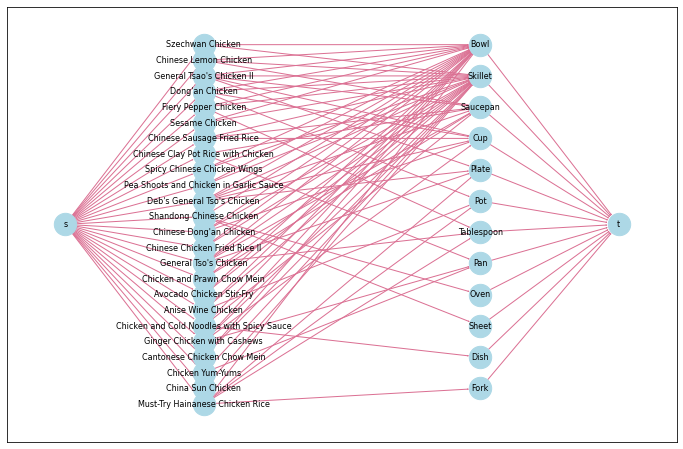

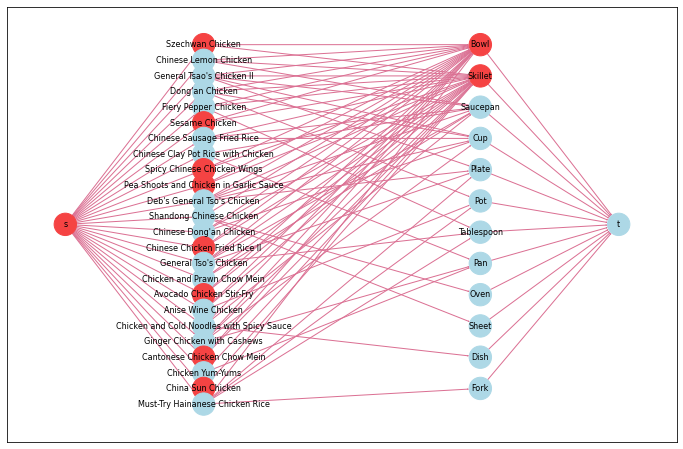

Recipes chosen: Szechwan Chicken, Sesame Chicken, Spicy Chinese Chicken Wings, Pea Shoots and Chicken in Garlic Sauce, Chinese Chicken Fried Rice II, Avocado Chicken Stir-Fry, Cantonese Chicken Chow Mein, and China Sun Chicken.
Utensils needed: Bowl, and Skillet.


In [21]:
G = create_graph(chinese_recipes,utensils,chinese_recipes_benefit,utensils_cost,edges_between_chinese_recipes_and_utensils)
solve_and_plot_graphs(G,False)

**Q:** What are the recipes and utensils chosen?

**A:** <font color='blue'> Recipes chosen: Szechwan Chicken, Sesame Chicken, Spicy Chinese Chicken Wings, Pea Shoots and Chicken in Garlic Sauce, Chinese Chicken Fried Rice II, Avocado Chicken Stir-Fry, Cantonese Chicken Chow Mein, and China Sun Chicken. Utensils needed: Bowl, and Skillet. </font>

Let's use these two functions to solve an even larger-scale problem. We'll now select the Indian recipes that would maximize our profits. Unlike last example, each Indian recipe is associated with corresponding ingredients. Toggle the output after editing and running the cells.

In [25]:
indian_recipes = []
ingredients = []
indian_recipes_revenue = []
ingredients_cost = []
edges_between_indian_recipes_and_ingredients = []
with open('indian_foods.csv') as indian_foods:
    indian_foods_dict = csv.DictReader(indian_foods)
    for row in indian_foods_dict:
        edges_between_indian_recipes_and_ingredients.append([row['Name'],row['Ingredient']])
        if row['Name'] not in indian_recipes:
            indian_recipes.append(row['Name'])
            indian_recipes_revenue.append(int(row['Recipe Revenue']))
        if row["Ingredient"] not in ingredients:
            ingredients.append(row['Ingredient'])
            ingredients_cost.append(int(row['Ingredient Cost']))

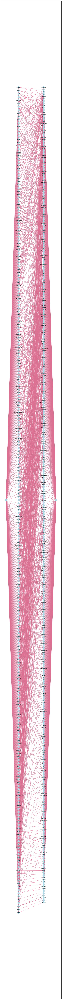

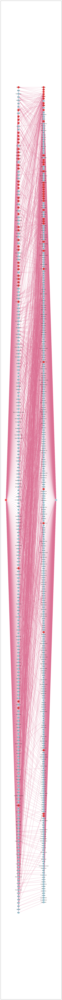

Recipes chosen: Balu Shahi, Kaju Katli, Kheer, Laddu, Lassi, Phirni, Rabri, Sheera, Singori, Sohan Papdi, Chhena Jalebi, Chhena Kheeri, Chhena Poda, Kheer Sagar, Ledikeni, Misti Doi, Pantua, Pithe, Rasgulla, Sandesh, Ariselu, Chikki, Kakinada Khaja, Kuzhi Paniyaram, Palathalikalu, Pongal, Pootharekulu, Kajjikaya, Anarsa, Basundi, Doodhpak, Mahim Halwa, Modak, Shankarpali, Chak Hao Kheer, Paravannam, Kansar, Khakhra, and Gheela Pitha.
Utensils needed: Maida Flour, Yogurt, Oil, Sugar, Gram Flour, Ghee, Milk, Cashews, Flour, Saffron, Cardamom, Rice, Dried Fruits, Nuts, Powdered Sugar, Condensed Milk, Spices, Semolina, Khoa, Coconut, Molu Leaf, Dry Fruits, Chhena, Chenna Cheese, Chenna, Jaggery, Rice Flour, Wheat Flour, Peanuts, Black Lentils, Khus-Khus Seeds, Whole Wheat Flour, Low Fat, Bengal Gram Flour, Raw Rice, Rapeseed Oil, Sticky Rice, and Orange Rind.


In [26]:
# TODO: Create a graph using the create_graph function

### BEGIN SOLUTION
G = create_graph(indian_recipes,ingredients,indian_recipes_revenue,ingredients_cost,edges_between_indian_recipes_and_ingredients)
### END SOLUTION

solve_and_plot_graphs(G,True)

## Secret Ties

In the Project Selection Problem, it is possible for there to be a tie. That is, there may be multiple different combinations of projects that lead to the same optimal profit (or whatever the objective value is, which is not always monetary profit).

As long as one of these tied sets is not a subset of the other, then there are at least two other combinations of projects that also lead to the same optimal profit.

In this section of the lab, we will explore these secret ties and show why they exist.

![](images-lab/cut_tie.png)

Take the small graph above. Each of the two cuts shown are minimal.


**Q:** What is the capacity of either of the cuts?

**A:** <font color='blue'> 17  </font>

**Q:** What is the capacity of the intersection of the two min cuts?
    
**A:** <font color='blue'> 17 </font>
    
**Q:** What is the capacity of the union of the two min cuts?
    
**A:** <font color='blue'> 17 </font>
    
Huh. This is interesting! Let's see if this is true for all instance of the project selection problem in general.

#### Additional projects and tools

Let's say we have an arbitrary project selection problem. with two distinct known optimal combinations of projects.

Choose one of the optimal sets of projects, and take all the projects that are part of that optimal set but not of the other optimal set. We'll call these the "additional" projects.

**Q:** For the same example graph above with a red and a blue cut, write down an additional project.

**A:** <font color='blue'> P1 or P3. </font>

Each of the additional set of projects also requires a set of tools. However, some of those tools may already be necessary for one of the projects in the optimal set that the projects in the additional set are not a part of. We will refer to the tools that are required by an additional project but are not already required by a project in the other optimal set as additional tools.

**Q:** In the same example graph above, write down the additional tool corresponding to the additional project you chose in the last question.
    
**A:** <font color='blue'> T1 if your last answer was P1, T4 if your last answer was P4. </font>
    
Defining additional projects and tools will help us understand the secret ties.

#### Balanced costs and benefits

**Q:** For the same example graph, take the additional project and additional tool in the red region. What is the benefit of the additional project? What is the cost of the additional tool?

**A:** <font color='blue'> Both the benefit and the cost is three. </font>
    
In our example graph, we see that the benefit of an optimal project is equal to the cost of the corresponding optimal tool. We will now show that this is not only true for our example, but for all project selection problems in general.

Instead of directly showing that the above statement is true, we will show that the statement cannot be false. We do this by showing that something impossible would happen if the statement was assumed to be false. This is a very common strategy called a _proof by contradiction_.

So for the sake of contradiction, let's assume that the total benefit from the additional projects _is not_ equal to the total cost of the additional tools. This either means that the total benefit of the additional projects is greater than the total cost of the additional tools, or that the total benefit of the additional projects is less than the total cost of the additional tools. We will now show that in either case, a contradiction happens.

1. In the case that the total benefit of the additional projects is greater than the total cost of the additional tools, adding the additional projects to the the other optimal set will improve the profit. This is the same as taking the union of both optimal sets. But wait a minute, if the union of the two optimal sets results in a set with a higher profit than the optimal sets, then the optimal sets are not optimal at all! We have found a contradiction.

2. Now we are going to let you handle the second case!
  - **Q:** Show that there exists a contradiction if the total benefit of the additional projects were less than total cost of the additional tools
  - **A:** <font color='blue'> In this case, the profit of the optimal set which includes the additional set can be improved by getting rid of the additional projects. Thus, the intersection of the two optimal sets has a higher profit than one of the optimal sets. As in the first case, we have found a contradiction by showing that the optimal sets aren't actually optimal because there is another set with a higher profit. </font>

Because we found a contradiction in both possible cases, the total benefit from the additional projects must in fact be equal to the total cost of the additional tools!

#### Unserstanding secret ties

Because additional costs and benefits are equal, including an additional set of projects does not actually change the profit. Whether you choose to include the additional profits or not, your profit will be the same. Thus, the intersection or the union of two optimal sets will have the same profit.

And we're done! We have shown that if you have at least two optimal sets of projects, then the intersection and the union of those sets will also be optimal.

#### Is this result useful?

Is this result useful? In some ways, it is not. In theory, all the benefit and cost values should perfectly capture the real-world costs and benefits.

However, in practice it may be a challenge to come up with quantitative values for more qualitative costs or benefits. There may be minor factors that are complicated to quantify, but because they have little influence it is not worth the effort to incorporate them in the model. In these type of cases, looking for ties and using the minor qualitative factors to break them may prove useful.

There might also be dependencies in the benefits. For example, how would you desincentivize choosing a large number of projects? These are costs that apply to the number of projects, but not to any one project in particular, so it cannot be captured in the individual benefit values. Looking for ties allows you easily find the optimal combination with the fewest number of projects.